In [1]:
from bs4 import BeautifulSoup
import requests
import pandas as pd
from urllib.request import urlopen, Request
from bs4 import BeautifulSoup, Comment
from selenium.webdriver.common.keys import Keys
import pandas as pd
import numpy as np
from selenium import webdriver
import time
import random
import re
import os
from copy import deepcopy

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import statsmodels.api as sm
import statsmodels.formula.api as smf
import patsy
import scipy.stats as stats


from sklearn import linear_model
from sklearn.linear_model import LinearRegression, Ridge, Lasso, LassoCV, RidgeCV
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.metrics import r2_score




In [2]:
df = pd.read_csv('C:/Users/Mert/Desktop/meta.csv')


In [3]:
df.loc[df['multi'] == '# of players: No Online Multiplayer', 'multi'] = 0
df.loc[df['multi'] != 0, 'multi'] = 1

In [4]:
del df['user_score']

In [5]:
df1 = df["genre"].str.split(",", n = 1, expand = True)
df.drop(columns=["genre"], inplace=True)

In [6]:
df1.drop(columns=[1],inplace=True)

In [7]:
df1

,0
0,Genre(s): Action Adventure
1,Genre(s): Driving
2,Genre(s): Role-Playing
3,Genre(s): Action Adventure
4,Genre(s): Action
...,...
5986,Genre(s): Action
5987,Genre(s): Action
5988,Genre(s): Driving
5989,Genre(s): Sports


In [8]:
df1.head()

,0
0,Genre(s): Action Adventure
1,Genre(s): Driving
2,Genre(s): Role-Playing
3,Genre(s): Action Adventure
4,Genre(s): Action


In [9]:
new = df

In [10]:
new['genre'] = df1[0]

In [11]:
new

,Unnamed: 0,name,date,platform,multi,meta_score,rating,genre
0,0,RESIDENT EVIL CODE: VERONICA,"Release Date: Feb 29, 2000",Dreamcast,0,94,Rating: M,Genre(s): Action Adventure
1,1,BURNOUT 3: TAKEDOWN,"Release Date: Sep 7, 2004",Xbox,1,94,Rating: T,Genre(s): Driving
2,2,DIABLO,"Release Date: Dec 31, 1996",PC,1,94,Rating: M,Genre(s): Role-Playing
3,3,METAL GEAR SOLID 3: SUBSISTENCE,"Release Date: Mar 14, 2006",PlayStation 2,1,94,Rating: M,Genre(s): Action Adventure
4,4,CALL OF DUTY: MODERN WARFARE 2,"Release Date: Nov 10, 2009",Xbox 360,1,94,Rating: M,Genre(s): Action
...,...,...,...,...,...,...,...,...
5986,3128,POWER STONE 2,"Release Date: Aug 23, 2000",Dreamcast,1,87,Rating: T,Genre(s): Action
5987,3129,CUPHEAD,"Release Date: Apr 17, 2019",Switch,0,87,Rating: E10+,Genre(s): Action
5988,3130,BURNOUT PARADISE: THE ULTIMATE BOX,"Release Date: Feb 5, 2009",PC,1,87,Rating: E10+,Genre(s): Driving
5989,3131,FIFA SOCCER 09,"Release Date: Oct 13, 2008",Xbox 360,1,87,Rating: E,Genre(s): Sports


In [12]:
new = new.loc[:, ~new.columns.str.contains('^Unnamed')]


In [13]:
new

,name,date,platform,multi,meta_score,rating,genre
0,RESIDENT EVIL CODE: VERONICA,"Release Date: Feb 29, 2000",Dreamcast,0,94,Rating: M,Genre(s): Action Adventure
1,BURNOUT 3: TAKEDOWN,"Release Date: Sep 7, 2004",Xbox,1,94,Rating: T,Genre(s): Driving
2,DIABLO,"Release Date: Dec 31, 1996",PC,1,94,Rating: M,Genre(s): Role-Playing
3,METAL GEAR SOLID 3: SUBSISTENCE,"Release Date: Mar 14, 2006",PlayStation 2,1,94,Rating: M,Genre(s): Action Adventure
4,CALL OF DUTY: MODERN WARFARE 2,"Release Date: Nov 10, 2009",Xbox 360,1,94,Rating: M,Genre(s): Action
...,...,...,...,...,...,...,...
5986,POWER STONE 2,"Release Date: Aug 23, 2000",Dreamcast,1,87,Rating: T,Genre(s): Action
5987,CUPHEAD,"Release Date: Apr 17, 2019",Switch,0,87,Rating: E10+,Genre(s): Action
5988,BURNOUT PARADISE: THE ULTIMATE BOX,"Release Date: Feb 5, 2009",PC,1,87,Rating: E10+,Genre(s): Driving
5989,FIFA SOCCER 09,"Release Date: Oct 13, 2008",Xbox 360,1,87,Rating: E,Genre(s): Sports


In [14]:
new.genre.nunique()

40

In [15]:
df2 = df["date"].str.split(",", n = 1, expand = True)
new.drop(columns=["date"], inplace=True)

C:\Users\Mert\anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [16]:
df2

,0,1
0,Release Date: Feb 29,2000
1,Release Date: Sep 7,2004
2,Release Date: Dec 31,1996
3,Release Date: Mar 14,2006
4,Release Date: Nov 10,2009
...,...,...
5986,Release Date: Aug 23,2000
5987,Release Date: Apr 17,2019
5988,Release Date: Feb 5,2009
5989,Release Date: Oct 13,2008


In [17]:
df2.drop(columns=[0],inplace=True)

In [18]:
new['date'] = df2[1]


<ipython-input-18-ade9b5300f2e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new['date'] = df2[1]


In [19]:
new

,name,platform,multi,meta_score,rating,genre,date
0,RESIDENT EVIL CODE: VERONICA,Dreamcast,0,94,Rating: M,Genre(s): Action Adventure,2000
1,BURNOUT 3: TAKEDOWN,Xbox,1,94,Rating: T,Genre(s): Driving,2004
2,DIABLO,PC,1,94,Rating: M,Genre(s): Role-Playing,1996
3,METAL GEAR SOLID 3: SUBSISTENCE,PlayStation 2,1,94,Rating: M,Genre(s): Action Adventure,2006
4,CALL OF DUTY: MODERN WARFARE 2,Xbox 360,1,94,Rating: M,Genre(s): Action,2009
...,...,...,...,...,...,...,...
5986,POWER STONE 2,Dreamcast,1,87,Rating: T,Genre(s): Action,2000
5987,CUPHEAD,Switch,0,87,Rating: E10+,Genre(s): Action,2019
5988,BURNOUT PARADISE: THE ULTIMATE BOX,PC,1,87,Rating: E10+,Genre(s): Driving,2009
5989,FIFA SOCCER 09,Xbox 360,1,87,Rating: E,Genre(s): Sports,2008


In [20]:
df3 = df["rating"].str.split(":", n = 1, expand = True)
new.drop(columns=["rating"], inplace=True)

C:\Users\Mert\anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [21]:
df3

,0,1
0,Rating,M
1,Rating,T
2,Rating,M
3,Rating,M
4,Rating,M
...,...,...
5986,Rating,T
5987,Rating,E10+
5988,Rating,E10+
5989,Rating,E


In [22]:
df3.drop(columns=[0],inplace=True)

In [23]:
new['rating'] = df3[1]

<ipython-input-23-42e9586c59f4>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new['rating'] = df3[1]


In [88]:
new6

,name,platform,multi,meta_score,genre,date,rating,years,target_age
2,DIABLO,PC,1,94,Role-Playing,1996,M,26,17.0
6,THE SIMS,PC,1,92,Simulation,2000,T,22,13.0
8,SID MEIER'S GETTYSBURG!,PC,1,92,Strategy,1997,E,25,6.0
35,TIGER WOODS PGA TOUR 2004,PC,1,88,Sports,2003,E,19,6.0
36,WARCRAFT III: THE FROZEN THRONE,PC,1,88,Strategy,2003,T,19,13.0
39,STARCRAFT,PC,1,88,Strategy,1998,T,24,13.0
40,SID MEIER'S PIRATES!,PC,0,88,Strategy,2004,E,18,6.0
42,BATTLEFIELD: BAD COMPANY 2 VIETNAM,PC,0,88,Action,2010,M,12,17.0
44,STARCRAFT,PC,1,88,Strategy,1998,T,24,13.0
46,BATTLEFIELD: BAD COMPANY 2,PC,1,87,Action,2010,M,12,17.0


In [25]:
new.genre.str.strip()

0       Genre(s): Action Adventure
1                Genre(s): Driving
2           Genre(s): Role-Playing
3       Genre(s): Action Adventure
4                 Genre(s): Action
                   ...            
5986              Genre(s): Action
5987              Genre(s): Action
5988             Genre(s): Driving
5989              Genre(s): Sports
5990            Genre(s): Strategy
Name: genre, Length: 5991, dtype: object

In [26]:
new.genre.unique()

array(['Genre(s): Action Adventure', 'Genre(s): Driving',
       'Genre(s): Role-Playing', 'Genre(s): Action', 'Genre(s): Sports',
       'Genre(s): Simulation', 'Genre(s): Strategy',
       'Genre(s): Action RPG', 'Genre(s): Adventure',
       'Genre(s): Miscellaneous', 'Genre(s): Racing', 'Genre(s): Puzzle',
       'Genre(s): Platformer', 'Genre(s): General', 'Genre(s): Fantasy',
       'Genre(s): Horror', 'Genre(s): Modern', 'Genre(s): Shooter',
       'Genre(s): Sci-Fi', 'Genre(s): Edutainment',
       'Genre(s): Massively Multiplayer Online', 'Genre(s): First-Person',
       'Genre(s): Scrolling', 'Genre(s): Arcade', 'Genre(s): Party',
       'Genre(s): Third-Person', 'Genre(s): Alternative',
       'Genre(s): Traditional', 'Genre(s): Historic',
       'Genre(s): GT / Street', 'Genre(s): Other',
       'Genre(s): Compilation', 'Genre(s): PC-style RPG', 'Genre(s): Sim',
       'Genre(s): Card Battle', 'Genre(s): Japanese-Style',
       'Genre(s): Ice Hockey', 'Genre(s): Dancing',
 

In [27]:
pd.set_option("display.max_rows", None)


In [28]:
new2 = new[new['date'].notna()]


In [29]:
new2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5990 entries, 0 to 5990
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   name        5990 non-null   object
 1   platform    5990 non-null   object
 2   multi       5990 non-null   object
 3   meta_score  5990 non-null   int64 
 4   genre       5990 non-null   object
 5   date        5990 non-null   object
 6   rating      5990 non-null   object
dtypes: int64(1), object(6)
memory usage: 374.4+ KB


In [30]:
df5 = df["genre"].str.split(":", n = 1, expand = True)
new.drop(columns=["genre"], inplace=True)

C:\Users\Mert\anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [31]:
df5.drop(columns=[0],inplace=True)

In [32]:
new2['genre'] = df5[1]

<ipython-input-32-893a6c040261>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new2['genre'] = df5[1]


In [33]:
new2

,name,platform,multi,meta_score,genre,date,rating
0,RESIDENT EVIL CODE: VERONICA,Dreamcast,0,94,Action Adventure,2000,M
1,BURNOUT 3: TAKEDOWN,Xbox,1,94,Driving,2004,T
2,DIABLO,PC,1,94,Role-Playing,1996,M
3,METAL GEAR SOLID 3: SUBSISTENCE,PlayStation 2,1,94,Action Adventure,2006,M
4,CALL OF DUTY: MODERN WARFARE 2,Xbox 360,1,94,Action,2009,M
5,SSX 3,GameCube,1,92,Sports,2003,E
6,THE SIMS,PC,1,92,Simulation,2000,T
7,BANJO-KAZOOIE,Nintendo 64,1,92,Action,1998,E
8,SID MEIER'S GETTYSBURG!,PC,1,92,Strategy,1997,E
9,CELESTE,Switch,0,92,Action,2018,E10+


In [34]:
new2['date'] = new2['date'].astype(int)


<ipython-input-34-db8610345eeb>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new2['date'] = new2['date'].astype(int)


In [35]:
new2['years'] = 2022 - new2['date']

<ipython-input-35-a4e1c9702a1c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new2['years'] = 2022 - new2['date']


In [38]:
new2

,name,platform,multi,meta_score,genre,date,rating,years
0,RESIDENT EVIL CODE: VERONICA,Dreamcast,0,94,Action Adventure,2000,M,22
1,BURNOUT 3: TAKEDOWN,Xbox,1,94,Driving,2004,T,18
2,DIABLO,PC,1,94,Role-Playing,1996,M,26
3,METAL GEAR SOLID 3: SUBSISTENCE,PlayStation 2,1,94,Action Adventure,2006,M,16
4,CALL OF DUTY: MODERN WARFARE 2,Xbox 360,1,94,Action,2009,M,13
5,SSX 3,GameCube,1,92,Sports,2003,E,19
6,THE SIMS,PC,1,92,Simulation,2000,T,22
7,BANJO-KAZOOIE,Nintendo 64,1,92,Action,1998,E,24
8,SID MEIER'S GETTYSBURG!,PC,1,92,Strategy,1997,E,25
9,CELESTE,Switch,0,92,Action,2018,E10+,4


In [39]:
new2["rating"] = new2.rating.str.strip()

<ipython-input-39-1e9d74bad4a3>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new2["rating"] = new2.rating.str.strip()


In [55]:
new2.genre.value_counts()

 Action              1936
 Action Adventure     724
 Role-Playing         669
 Sports               586
 Strategy             531
 Driving              416
 Adventure            377
 Miscellaneous        345
 Simulation           133
 General               70
 Puzzle                53
 Fantasy               32
Name: genre, dtype: int64

In [80]:
new2.genre.unique()

array([' Action Adventure', ' Driving', ' Role-Playing', ' Action',
       ' Sports', ' Simulation', ' Strategy', ' Action RPG', ' Adventure',
       ' Miscellaneous', ' Racing', ' Puzzle', ' General', ' Fantasy',
       ' Sim', ' Ice Hockey', ' Fighting'], dtype=object)

In [264]:
new2.drop(new2[new2['genre'] == ' Japanese-Style'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' Compilation'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' Edutainment'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' Edutainment'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' Edutainment'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' First-Person'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' Third-Person'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' Platformer'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' PC-style RPG'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' Shooter'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' Sci-Fi'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' Horror'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' Card Battle'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' Modern'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' Massively Multiplayer Online'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' GT / Street'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' Party'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' Arcade'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' Alternative'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' Traditional'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' Dancing'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' Scrolling'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' Other'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' Historic'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' City Building'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' Fantasy'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' General'].index, inplace = True)
new2.drop(new2[new2['genre'] == ' Puzzle'].index, inplace = True)


C:\Users\Mert\anaconda3\lib\site-packages\pandas\core\frame.py:4308: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [265]:
new2.platform.value_counts()

PC               1455
PlayStation 5      37
Name: platform, dtype: int64

In [266]:
new2.loc[new2['platform'] == 'Platform: PlayStation 3', 'platform'] = 'PlayStation 3'
new2.loc[new2['platform'] == 'Platform: Nintendo 64', 'platform'] = 'Nintendo 64'
new2.loc[new2['platform'] == 'Platform: PC', 'platform'] = 'PC'
new2.loc[new2['platform'] == 'Platform: Xbox', 'platform'] = 'Xbox'
new2.loc[new2['platform'] == 'Platform: GameCube', 'platform'] = 'GameCube'
new2.loc[new2['platform'] == 'Platform: PlayStation 3', 'platform'] = 'PlayStation 3'
new2.loc[new2['platform'] == 'Platform: PlayStation 4', 'platform'] = 'PlayStation 4'
new2.loc[new2['platform'] == 'Platform: PlayStation 2', 'platform'] = 'PlayStation 2'
new2.loc[new2['platform'] == 'Platform: DS', 'platform'] = 'DS'
new2.loc[new2['platform'] == 'Platform: Switch', 'platform'] = 'Switch'
new2.loc[new2['platform'] == 'Platform: PlayStation', 'platform'] = 'PlayStation'
new2.loc[new2['platform'] == 'Platform: 3DS', 'platform'] = '3DS'
new2.loc[new2['platform'] == 'Platform: Wii', 'platform'] = 'Wii'
new2.loc[new2['platform'] == 'Platform: Dreamcast', 'platform'] = 'Dreamcast'
new2.loc[new2['platform'] == 'Platform: PSP', 'platform'] = 'PSP'
new2.loc[new2['platform'] == 'Platform: Game Boy Advance', 'platform'] = 'Game Boy Advance'
new2.loc[new2['platform'] == 'Platform: PlayStation Vita', 'platform'] = 'PlayStation Vita'
new2.loc[new2['platform'] == 'Platform: Wii U', 'platform'] = 'Wii U'
new2.loc[new2['platform'] == 'Platform: Xbox One', 'platform'] = 'Xbox One'
new2.loc[new2['platform'] == 'Platform: Xbox 360', 'platform'] = 'Xbox 360'



C:\Users\Mert\anaconda3\lib\site-packages\pandas\core\indexing.py:1720: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


In [267]:
new2.platform.unique()

array(['PC', 'PlayStation 5'], dtype=object)

In [268]:
esrb = deepcopy(new2['rating'])   

esrb.replace('E', 6, inplace=True) 
esrb.replace('E10+', 10, inplace=True) 
esrb.replace('T', 13, inplace=True) 
esrb.replace('M', 17, inplace=True)
esrb.replace('K-A', 0, inplace=True)
esrb.replace('AO', 18, inplace=True)
esrb.replace('RP', np.nan, inplace=True)

new2['target_age'] = esrb

<ipython-input-268-e37b543c1177>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  new2['target_age'] = esrb


In [271]:
new2.genre.unique()

array([' Role-Playing', ' Simulation', ' Strategy', ' Sports', ' Action',
       ' Miscellaneous', ' Adventure', ' Driving'], dtype=object)

In [270]:
new2.loc[new2['genre'] == ' Action RPG', 'genre'] = ' Action'
new2.loc[new2['genre'] == ' Racing', 'genre'] = ' Driving'
new2.loc[new2['genre'] == ' Ice Hockey', 'genre'] = ' Sports'
new2.loc[new2['genre'] == ' Fighting', 'genre'] = ' Sports'
new2.loc[new2['genre'] == ' Sim', 'genre'] = ' Simulation'
new2.loc[new2['genre'] == ' Action Adventure', 'genre'] = ' Action'





In [83]:
new2.genre.value_counts()

 Action              391
 Strategy            273
 Role-Playing        198
 Action Adventure    190
 Adventure           175
 Driving              83
 Sports               81
 Simulation           54
 Miscellaneous        47
 General              34
 Puzzle               11
 Fantasy               9
Name: genre, dtype: int64

In [90]:
top5_genre = pd.DataFrame(new2['genre'].value_counts().head(5))
top5_genre

,genre
Action,1936
Action Adventure,724
Role-Playing,669
Sports,586
Strategy,531


In [272]:
new5 = new2

In [273]:
new5.drop(new5[new5['platform'] == 'Dreamcast'].index, inplace = True)
new5.drop(new5[new5['platform'] == 'Xbox'].index, inplace = True)
new5.drop(new5[new5['platform'] == 'PlayStation 2'].index, inplace = True)
new5.drop(new5[new5['platform'] == 'GameCube'].index, inplace = True)
new5.drop(new5[new5['platform'] == 'Nintendo 64'].index, inplace = True)
new5.drop(new5[new5['platform'] == 'Game Boy Advance'].index, inplace = True)
new5.drop(new5[new5['platform'] == 'PlayStation Vita'].index, inplace = True)
new5.drop(new5[new5['platform'] == 'Xbox One'].index, inplace = True)
new5.drop(new5[new5['platform'] == 'Wii'].index, inplace = True)
new5.drop(new5[new5['platform'] == 'DS'].index, inplace = True)
new5.drop(new5[new5['platform'] == 'Xbox 360'].index, inplace = True)
new5.drop(new5[new5['platform'] == 'Switch'].index, inplace = True)
new5.drop(new5[new5['platform'] == 'PlayStation 3'].index, inplace = True)
new5.drop(new5[new5['platform'] == 'PlayStation 4'].index, inplace = True)
new5.drop(new5[new5['platform'] == '3DS'].index, inplace = True)
new5.drop(new5[new5['platform'] == 'PlayStation'].index, inplace = True)
new5.drop(new5[new5['platform'] == 'Wii U'].index, inplace = True)
new5.drop(new5[new5['platform'] == 'PSP'].index, inplace = True)
new5.drop(new5[new5['platform'] == 'Xbox Series X'].index, inplace = True)
new5.drop(new5[new5['platform'] == 'Playstation 5'].index, inplace = True)
new5.drop(new5[new5['platform'] == 'Playstation 5'].index, inplace = True)


In [183]:
new6.reset_index(drop=True, inplace=True)

In [274]:
df_mod = pd.get_dummies(new5, columns=['genre'], drop_first=True)

df_mod.head(1)
df_mod['meta_score'] = np.log(df_mod['meta_score'])

In [286]:
df_mod["multi"] = df_mod["multi"].astype(int)
df_mod = df_mod["target_age"].dropna()


In [287]:
df_mod.head(5)

0    17.0
1    13.0
2     6.0
3     6.0
4    13.0
Name: target_age, dtype: float64

In [288]:
Xb= df_mod.drop(columns=["meta_score","name","date","rating","platform","target_age"])
yb= df_mod.loc[:,"meta_score"]

IndexingError: Too many indexers

In [289]:
game_modelb = sm.OLS(yb, Xb, data=df_mod)

resultsb = game_modelb.fit()

print(resultsb.summary())

ValueError: The indices for endog and exog are not aligned

In [189]:
new2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1546 entries, 0 to 1545
Data columns (total 9 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   name        1546 non-null   object 
 1   platform    1546 non-null   object 
 2   multi       1546 non-null   object 
 3   meta_score  1546 non-null   int64  
 4   genre       1546 non-null   object 
 5   date        1546 non-null   int32  
 6   rating      1546 non-null   object 
 7   years       1546 non-null   int32  
 8   target_age  1545 non-null   float64
dtypes: float64(1), int32(2), int64(1), object(5)
memory usage: 96.8+ KB


In [190]:
#For Target_Age(ESRB_RATING)
lr = LinearRegression()
X = df_dummy['target_age'].values.reshape(-1,1)
y = np.array(df_dummy.meta_score)

lr.fit(X, y)

ValueError: Input contains NaN, infinity or a value too large for dtype('float64').

NotFittedError: This LinearRegression instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

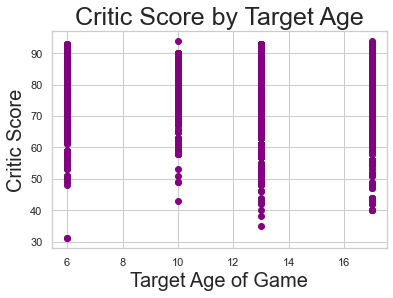

In [191]:
target_ages = df_dummy.target_age
scores = df_dummy.meta_score

plt.scatter(target_ages, scores, color='purple')
plt.title('Critic Score by Target Age', size=25)
plt.xlabel('Target Age of Game', size=20)
plt.ylabel('Critic Score', size=20)

#plotting the regression line
plt.plot(target_ages, lr.predict(target_ages.values.reshape(-1, 1)), color='red')

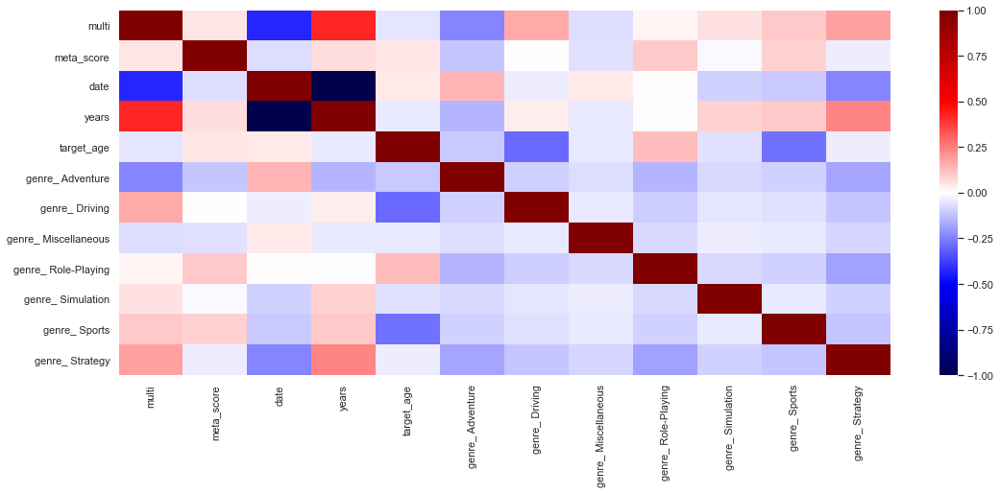

In [279]:
plt.figure(1, figsize=(18, 7))
sns.set(style="whitegrid")
sns.heatmap(df_mod.corr(), cmap="seismic", vmin=-1, vmax=1)
plt.yticks(rotation=0); 
plt.show()

In [193]:
df_mod.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1546 entries, 0 to 1545
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   name                     1546 non-null   object 
 1   platform                 1546 non-null   object 
 2   multi                    1546 non-null   int32  
 3   meta_score               1546 non-null   int64  
 4   date                     1546 non-null   int32  
 5   rating                   1546 non-null   object 
 6   years                    1546 non-null   int32  
 7   target_age               1545 non-null   float64
 8   genre_ Action Adventure  1546 non-null   uint8  
 9   genre_ Adventure         1546 non-null   uint8  
 10  genre_ Driving           1546 non-null   uint8  
 11  genre_ Fantasy           1546 non-null   uint8  
 12  genre_ General           1546 non-null   uint8  
 13  genre_ Miscellaneous     1546 non-null   uint8  
 14  genre_ Puzzle           

In [281]:

Xs= df_mod.loc[:,["multi","years","genre_ Adventure","genre_ Driving","genre_ Miscellaneous",
                  "genre_ Role-Playing","genre_ Simulation","genre_ Sports","genre_ Strategy"]]
ys= df_mod.loc[:,"meta_score"]

#Split data train (%60), test(%20) and validation (%20)
X, X_test, y, y_test = train_test_split(Xs,ys,test_size=0.2, random_state=10)

X_train, X_val, y_train, y_val = train_test_split(X,y, test_size=.25, random_state=10)


lm = LinearRegression()

#Feature scaling for train, val, and test so that we can run our ridge model on each
scaler = StandardScaler()

X_train_scaled = scaler.fit_transform(X_train.values)
X_val_scaled = scaler.transform(X_val.values)
X_test_scaled = scaler.transform(X_test.values)

lm_reg = Ridge(alpha=0.05, normalize=True)

lm_lasso = Lasso(alpha=0.05, normalize=True)

#Feature transforms for train, val, and test so that we can run our poly model on each
poly = PolynomialFeatures(degree=6) 

Xs_poly = poly.fit_transform(X.values)
X_train_poly = poly.fit_transform(X_train.values)
X_val_poly = poly.transform(X_val.values)
X_test_poly = poly.transform(X_test.values)

lm_poly = LinearRegression()

lm.fit(X_train, y_train)
print(f'Linear Regression for all data R^2: {lm.score(Xs, ys):.6f}')
print(f'Linear Regression for test data R^2: {lm.score(X_test, y_test):.6f}')
print(f'Linear Regression for validation data R^2: {lm.score(X_val, y_val):.6f}')
print("")

lm_reg.fit(X_train_scaled, y_train)
print(f'Ridge Regression for test data R^2: {lm_reg.score(X_test_scaled, y_test):.6f}')
print(f'Ridge Regression for validation data R^2: {lm_reg.score(X_val_scaled, y_val):.6f}')
print("")


lm_lasso.fit(X_train,y_train)
print(f'Lasso Regression for test data R^2: {lm_lasso.score(X_test, y_test):.6f}')
print(f'Lasso Regression for validation data R^2: {lm_lasso.score(X_val, y_val):.6f}')
print("")

lm_poly.fit(X_train_poly, y_train)
print(f'Degree 2 polynomial regression for test data R^2: {lm_poly.score(X_test_poly, y_test):.6f}')
print(f'Degree 2 polynomial regression for validation data R^2: {lm_poly.score(X_val_poly, y_val):.6f}')

Linear Regression for all data R^2: 0.032312
Linear Regression for test data R^2: 0.010653
Linear Regression for validation data R^2: 0.034087

Ridge Regression for test data R^2: 0.011348
Ridge Regression for validation data R^2: 0.034475

Lasso Regression for test data R^2: -0.000650
Lasso Regression for validation data R^2: -0.000115

Degree 2 polynomial regression for test data R^2: 0.029314
Degree 2 polynomial regression for validation data R^2: -166202521726.519684


In [282]:
# Run Cross Validation
kf = KFold(n_splits=10, shuffle=True, random_state = 16)
cross_val_score(lm, Xs, ys, cv=kf, scoring='r2')

print('Linear Regression:',round(np.mean(cross_val_score(lm, Xs, ys, cv=kf, scoring='r2')),5))
print('Ridge Regression:',round(np.mean(cross_val_score(lm_reg, Xs, ys, cv=kf, scoring='r2')),5))
print('Lasso Regression:',round(np.mean(cross_val_score(lm_lasso, Xs, ys, cv=kf, scoring='r2')),5))
print('Degree 2 Poly. Regression:',round(np.mean(cross_val_score(lm_poly, Xs, ys, cv=kf, scoring='r2')),5))

Linear Regression: 0.01926
Ridge Regression: 0.0197
Lasso Regression: -0.00921
Degree 2 Poly. Regression: 0.01926


In [146]:
df_mod.reset_index(drop=True, inplace=True)



In [147]:
df_mod

,name,platform,multi,meta_score,date,rating,years,target_age,genre_ Action Adventure,genre_ Adventure,genre_ Driving,genre_ Fantasy,genre_ General,genre_ Miscellaneous,genre_ Puzzle,genre_ Role-Playing,genre_ Simulation,genre_ Sports,genre_ Strategy
0,DIABLO,PC,1,94,1996,M,26,17.0,0,0,0,0,0,0,0,1,0,0,0
1,THE SIMS,PC,1,92,2000,T,22,13.0,0,0,0,0,0,0,0,0,1,0,0
2,SID MEIER'S GETTYSBURG!,PC,1,92,1997,E,25,6.0,0,0,0,0,0,0,0,0,0,0,1
3,TIGER WOODS PGA TOUR 2004,PC,1,88,2003,E,19,6.0,0,0,0,0,0,0,0,0,0,1,0
4,WARCRAFT III: THE FROZEN THRONE,PC,1,88,2003,T,19,13.0,0,0,0,0,0,0,0,0,0,0,1
5,STARCRAFT,PC,1,88,1998,T,24,13.0,0,0,0,0,0,0,0,0,0,0,1
6,SID MEIER'S PIRATES!,PC,0,88,2004,E,18,6.0,0,0,0,0,0,0,0,0,0,0,1
7,BATTLEFIELD: BAD COMPANY 2 VIETNAM,PC,0,88,2010,M,12,17.0,0,0,0,0,0,0,0,0,0,0,0
8,STARCRAFT,PC,1,88,1998,T,24,13.0,0,0,0,0,0,0,0,0,0,0,1
9,BATTLEFIELD: BAD COMPANY 2,PC,1,87,2010,M,12,17.0,0,0,0,0,0,0,0,0,0,0,0


In [136]:
df_mod.corr().meta_score.sort_values(ascending=False)


meta_score                 1.000000
genre_ Role-Playing        0.105493
genre_ Sports              0.092389
years                      0.084938
multi                      0.070379
target_age                 0.054061
genre_ Puzzle              0.036655
genre_ Driving             0.000478
genre_ Fantasy            -0.004620
genre_ Action Adventure   -0.009071
genre_ Simulation         -0.017925
genre_ Strategy           -0.034301
genre_ General            -0.035921
genre_ Miscellaneous      -0.065668
date                      -0.084938
genre_ Adventure          -0.127960
Name: meta_score, dtype: float64

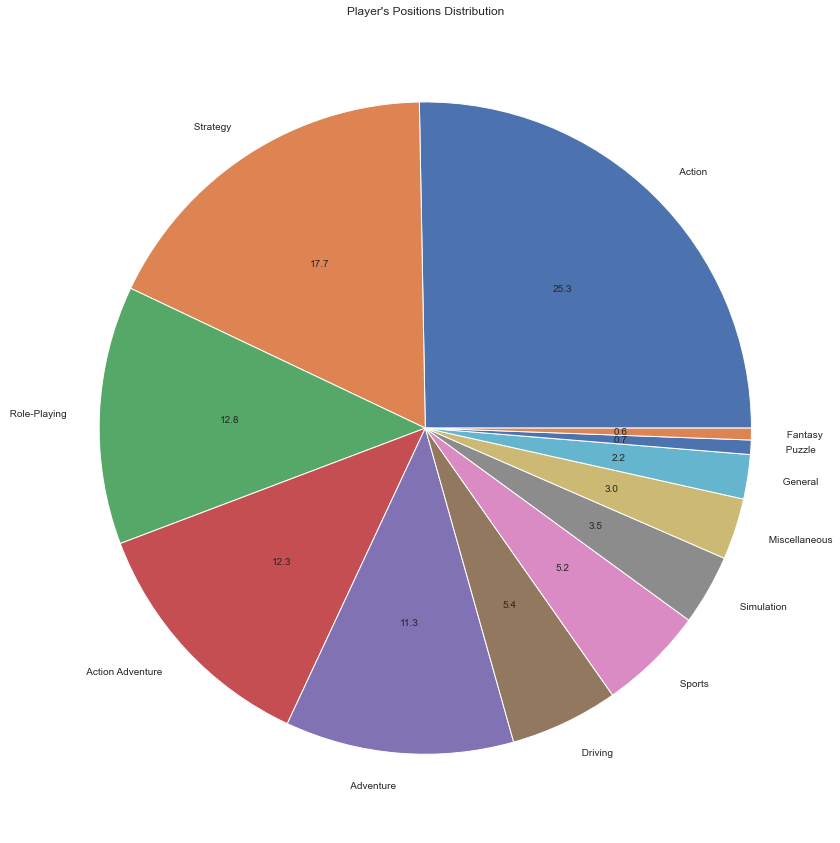

In [139]:
plt.figure(figsize=(15,15))
loc=new2.genre.value_counts()
loc.plot(kind='pie' ,autopct='%.1f',fontsize=10,subplots=True)
plt.title("Player's Positions Distribution")
plt.ylabel("")
plt.show()

In [176]:
df_mod

,name,platform,multi,meta_score,date,rating,years,genre_ Action Adventure,genre_ Adventure,genre_ Driving,genre_ Fantasy,genre_ General,genre_ Miscellaneous,genre_ Puzzle,genre_ Role-Playing,genre_ Simulation,genre_ Sports,genre_ Strategy
0,DIABLO,PC,1,94,1996,M,26,0,0,0,0,0,0,0,1,0,0,0
1,THE SIMS,PC,1,92,2000,T,22,0,0,0,0,0,0,0,0,1,0,0
2,SID MEIER'S GETTYSBURG!,PC,1,92,1997,E,25,0,0,0,0,0,0,0,0,0,0,1
3,TIGER WOODS PGA TOUR 2004,PC,1,88,2003,E,19,0,0,0,0,0,0,0,0,0,1,0
4,WARCRAFT III: THE FROZEN THRONE,PC,1,88,2003,T,19,0,0,0,0,0,0,0,0,0,0,1
5,STARCRAFT,PC,1,88,1998,T,24,0,0,0,0,0,0,0,0,0,0,1
6,SID MEIER'S PIRATES!,PC,0,88,2004,E,18,0,0,0,0,0,0,0,0,0,0,1
7,BATTLEFIELD: BAD COMPANY 2 VIETNAM,PC,0,88,2010,M,12,0,0,0,0,0,0,0,0,0,0,0
8,STARCRAFT,PC,1,88,1998,T,24,0,0,0,0,0,0,0,0,0,0,1
9,BATTLEFIELD: BAD COMPANY 2,PC,1,87,2010,M,12,0,0,0,0,0,0,0,0,0,0,0


In [283]:
regressor = LinearRegression()
regressor.fit(X,y)
coeff_df = pd.DataFrame(regressor.coef_, X.columns, columns=['Coefficient'])  
coeff_df.sort_values("Coefficient",ascending=False).T

,genre_ Sports,genre_ Role-Playing,multi,years,genre_ Driving,genre_ Simulation,genre_ Strategy,genre_ Adventure,genre_ Miscellaneous
Coefficient,0.046954,0.037882,0.007624,0.001648,-0.011262,-0.022646,-0.023606,-0.063069,-0.066373


In [284]:
y_pred = regressor.predict(X)
df = pd.DataFrame({'Actual': y, 'Predicted': y_pred})
df["Difference"] = df["Actual"]-df["Predicted"]
df_under = round(df.sort_values('Difference').head(10),2)
df_over = round(df.sort_values('Difference').tail(10),2)
df.sort_values('Difference')

,Actual,Predicted,Difference
235,3.433987,4.304626,-0.870639
233,3.637586,4.339145,-0.701559
230,3.688879,4.366047,-0.677168
1002,3.688879,4.338648,-0.649769
229,3.737670,4.367695,-0.630025
1001,3.737670,4.337000,-0.599331
743,3.737670,4.337000,-0.599331
1000,3.761200,4.356160,-0.594960
742,3.761200,4.356160,-0.594960
228,3.761200,4.335352,-0.574152


In [218]:
df_mod.count()

name                       1509
platform                   1509
multi                      1509
meta_score                 1509
date                       1509
rating                     1509
years                      1509
target_age                 1508
genre_ Action Adventure    1509
genre_ Adventure           1509
genre_ Driving             1509
genre_ Fantasy             1509
genre_ General             1509
genre_ Miscellaneous       1509
genre_ Puzzle              1509
genre_ Role-Playing        1509
genre_ Simulation          1509
genre_ Sports              1509
genre_ Strategy            1509
dtype: int64

In [181]:
df_mod.drop(df_mod[df_mod['platform'] == 'Playstation 5'].index, inplace = True)


In [201]:
df_mod

,name,platform,multi,meta_score,date,rating,years,target_age,genre_ Action Adventure,genre_ Adventure,genre_ Driving,genre_ Fantasy,genre_ General,genre_ Miscellaneous,genre_ Puzzle,genre_ Role-Playing,genre_ Simulation,genre_ Sports,genre_ Strategy
0,DIABLO,PC,1,94,1996,M,26,17.0,0,0,0,0,0,0,0,1,0,0,0
1,THE SIMS,PC,1,92,2000,T,22,13.0,0,0,0,0,0,0,0,0,1,0,0
2,SID MEIER'S GETTYSBURG!,PC,1,92,1997,E,25,6.0,0,0,0,0,0,0,0,0,0,0,1
3,TIGER WOODS PGA TOUR 2004,PC,1,88,2003,E,19,6.0,0,0,0,0,0,0,0,0,0,1,0
4,WARCRAFT III: THE FROZEN THRONE,PC,1,88,2003,T,19,13.0,0,0,0,0,0,0,0,0,0,0,1
5,STARCRAFT,PC,1,88,1998,T,24,13.0,0,0,0,0,0,0,0,0,0,0,1
6,SID MEIER'S PIRATES!,PC,0,88,2004,E,18,6.0,0,0,0,0,0,0,0,0,0,0,1
7,BATTLEFIELD: BAD COMPANY 2 VIETNAM,PC,0,88,2010,M,12,17.0,0,0,0,0,0,0,0,0,0,0,0
8,STARCRAFT,PC,1,88,1998,T,24,13.0,0,0,0,0,0,0,0,0,0,0,1
9,BATTLEFIELD: BAD COMPANY 2,PC,1,87,2010,M,12,17.0,0,0,0,0,0,0,0,0,0,0,0


In [212]:
a = df_mod.set_index('name')

In [219]:
b = a.reset_index()

In [ ]:
sns.heatmap(Xs.corr())


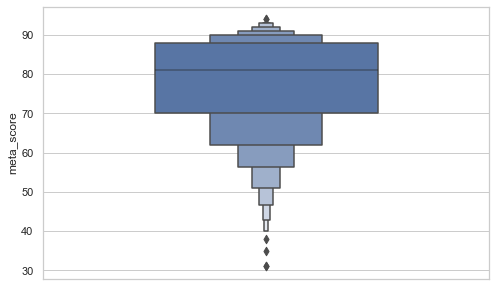

In [235]:
plt.figure(figsize=(8,5))
sns.boxenplot(y='meta_score', data=df_mod, width=0.5)
plt.show()

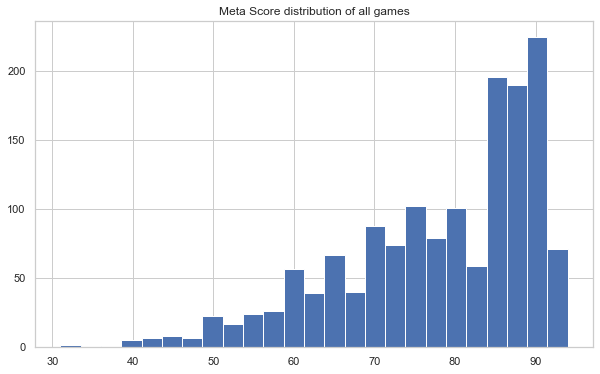

In [236]:
plt.figure(1, figsize=(10, 6))
sns.set(style="whitegrid")
plt.hist( x= 'meta_score', bins=25,data=df_mod)
plt.title('Meta Score distribution of all games')
plt.show()

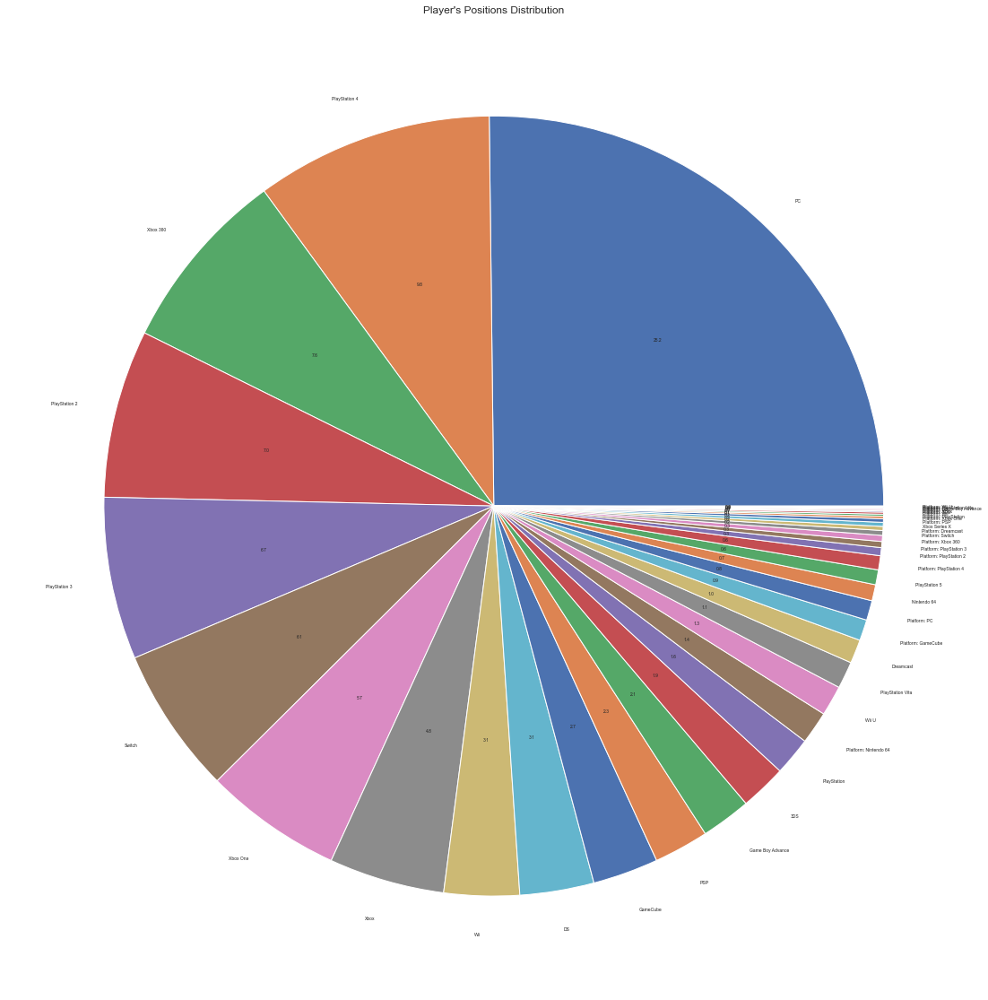

In [247]:
plt.figure(figsize=(20,20))
loc=new['platform'].value_counts()
loc.plot(kind='pie' ,autopct='%.1f',fontsize=5,subplots=True)
plt.title("Player's Positions Distribution")
plt.ylabel("")
plt.show()

In [248]:
df_mod['meta_score'] = np.log(df_mod['meta_score'])